<a href="https://colab.research.google.com/github/bhumikakamesh/ApplianceEnergy-Usage/blob/main/ApplianceEnergy_Usage.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install pandas numpy scikit-learn catboost matplotlib seaborn


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 7.4 MB/s eta 0:00:00


In [2]:
from google.colab import files
files.upload()



Saving energydata_complete.csv to energydata_complete.csv


{'energydata_complete.csv': b'"date","Appliances","lights","T1","RH_1","T2","RH_2","T3","RH_3","T4","RH_4","T5","RH_5","T6","RH_6","T7","RH_7","T8","RH_8","T9","RH_9","T_out","Press_mm_hg","RH_out","Windspeed","Visibility","Tdewpoint","rv1","rv2"\r\n"2016-01-11 17:00:00","  60","30","19.890000000000001","47.596666666666700","19.199999999999999","44.789999999999999","19.789999999999999","44.729999999999997","19.000000000000000","45.566666666666698","17.166666666666700","55.200000000000003"," 7.026666666666669947","84.2566666666667032","17.199999999999999","41.626666666666701","18.199999999999999","48.899999999999999","17.033333333333299","45.530000000000001"," 6.5999999999999996e+00","733.50000000000000"," 92.000000000000000"," 7.00000000000000000","63.0000000000000000"," 5.2999999999999998e+00","13.2754331571049988270","13.2754331571049988270"\r\n"2016-01-11 17:10:00","  60","30","19.890000000000001","46.693333333333300","19.199999999999999","44.722499999999997","19.789999999999999","4

In [3]:
!pip install kaggle



In [4]:
!ls


energydata_complete.csv  sample_data


In [7]:
import pandas as pd

df = pd.read_csv("energydata_complete.csv")
print(df.shape)
df.head()


(19735, 29)


,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
0,2016-01-11 17:00:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,...,17.033333,45.53,6.600000,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433
1,2016-01-11 17:10:00,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,...,17.066667,45.56,6.483333,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195
2,2016-01-11 17:20:00,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,...,17.000000,45.50,6.366667,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668
3,2016-01-11 17:30:00,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,...,17.000000,45.40,6.250000,733.8,92.0,6.000000,51.500000,5.0,45.410389,45.410389
4,2016-01-11 17:40:00,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,...,17.000000,45.40,6.133333,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097


In [9]:
print("Columns:\n", df.columns.tolist())


Columns:
 ['date', 'Appliances', 'lights', 'T1', 'RH_1', 'T2', 'RH_2', 'T3', 'RH_3', 'T4', 'RH_4', 'T5', 'RH_5', 'T6', 'RH_6', 'T7', 'RH_7', 'T8', 'RH_8', 'T9', 'RH_9', 'T_out', 'Press_mm_hg', 'RH_out', 'Windspeed', 'Visibility', 'Tdewpoint', 'rv1', 'rv2']


In [10]:
print("\nData Types:")
print(df.dtypes)



Data Types:
date            object
Appliances       int64
lights           int64
T1             float64
RH_1           float64
T2             float64
RH_2           float64
T3             float64
RH_3           float64
T4             float64
RH_4           float64
T5             float64
RH_5           float64
T6             float64
RH_6           float64
T7             float64
RH_7           float64
T8             float64
RH_8           float64
T9             float64
RH_9           float64
T_out          float64
Press_mm_hg    float64
RH_out         float64
Windspeed      float64
Visibility     float64
Tdewpoint      float64
rv1            float64
rv2            float64
dtype: object


In [11]:
print("\nMissing Values per Column:")
print(df.isnull().sum())


Missing Values per Column:
date           0
Appliances     0
lights         0
T1             0
RH_1           0
T2             0
RH_2           0
T3             0
RH_3           0
T4             0
RH_4           0
T5             0
RH_5           0
T6             0
RH_6           0
T7             0
RH_7           0
T8             0
RH_8           0
T9             0
RH_9           0
T_out          0
Press_mm_hg    0
RH_out         0
Windspeed      0
Visibility     0
Tdewpoint      0
rv1            0
rv2            0
dtype: int64


In [12]:
X = df.drop(columns=["Appliances"])
y = df["Appliances"]

print("Features:", X.shape)
print("Target:", y.shape)



Features: (19735, 28)
Target: (19735,)


In [13]:
# Fill missing values using median (robust & simple)
# Exclude non-numeric columns for median calculation as median cannot be computed for strings/objects.
X = X.select_dtypes(include=["number"])
X = X.fillna(X.median())

In [14]:
X = X.select_dtypes(include=["number"])


In [15]:
X = X.fillna(X.median())


In [16]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

print(X_train.shape, X_test.shape)


(15788, 27) (3947, 27)


In [17]:
Q1 = X_train.quantile(0.25)
Q3 = X_train.quantile(0.75)
IQR = Q3 - Q1

lower = Q1 - 1.5 * IQR
upper = Q3 + 1.5 * IQR

X_train = X_train.clip(lower=lower, upper=upper, axis=1)
X_test = X_test.clip(lower=lower, upper=upper, axis=1)


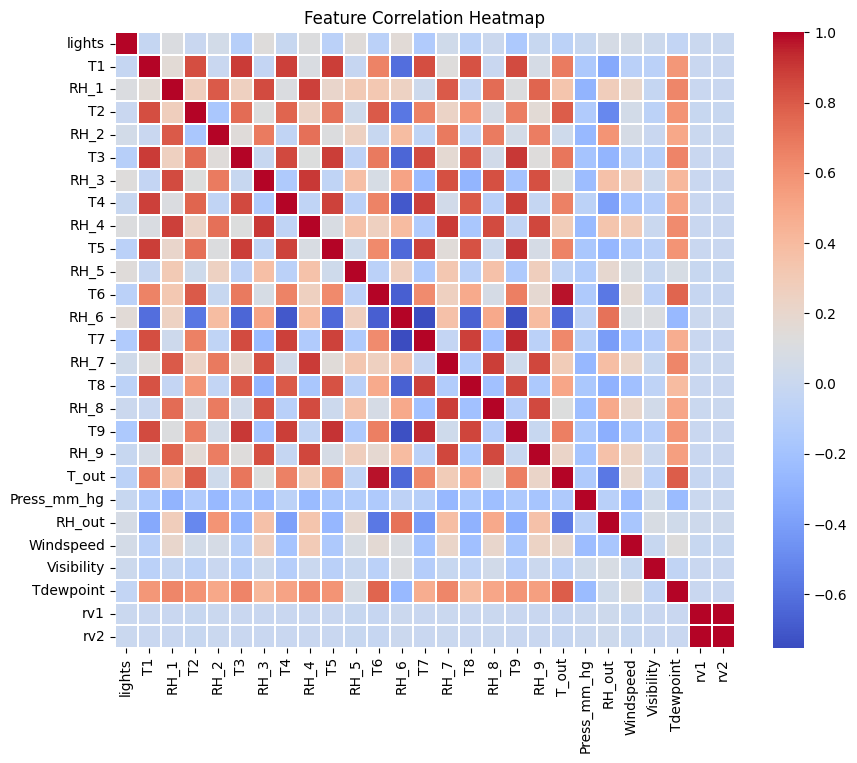

In [18]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,8))
sns.heatmap(X.corr(), cmap="coolwarm", linewidths=0.3)
plt.title("Feature Correlation Heatmap")
plt.show()


In [20]:
!pip install catboost


In [21]:
from sklearn.feature_selection import RFE
from catboost import CatBoostRegressor

rfe = RFE(
    estimator=CatBoostRegressor(
        iterations=200,
        learning_rate=0.1,
        depth=6,
        verbose=0
    ),
    n_features_to_select=15
)

rfe.fit(X_train, y_train)

selected_features = X_train.columns[rfe.support_]
X_train = X_train[selected_features]
X_test = X_test[selected_features]

print("Selected Features:", selected_features.tolist())


Selected Features: ['RH_1', 'T2', 'RH_2', 'T3', 'RH_3', 'T4', 'T5', 'RH_5', 'T6', 'T7', 'RH_7', 'T8', 'RH_8', 'Press_mm_hg', 'RH_out']


In [22]:
model = CatBoostRegressor(
    iterations=500,
    learning_rate=0.05,
    depth=6,
    loss_function='RMSE',
    verbose=100
)

model.fit(X_train, y_train)


0:	learn: 102.7012975	total: 6.75ms	remaining: 3.37s
100:	learn: 88.1038625	total: 628ms	remaining: 2.48s
200:	learn: 82.0362916	total: 1.22s	remaining: 1.82s
300:	learn: 77.5678630	total: 1.84s	remaining: 1.22s
400:	learn: 74.0320692	total: 2.44s	remaining: 602ms
499:	learn: 71.0891763	total: 3.05s	remaining: 0us


In [23]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np


In [24]:
y_pred = model.predict(X_test)


In [25]:
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

print(f"Mean Absolute Error (MAE): {mae:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"R² Score (acts like accuracy in regression): {r2:.3f}")

MAE : 41.44746062460988
RMSE: 79.02081901758022
R²  : 0.3760134908820688


In [32]:
from sklearn.metrics import accuracy_score

try:
    accuracy = accuracy_score(y_test, y_pred)
    print("Accuracy:", accuracy)
except Exception as e:
    print("Accuracy cannot be used for regression problems.")
    print("Reason:", e)


Accuracy cannot be used for regression problems.
Reason: Classification metrics can't handle a mix of multiclass and continuous targets


In [33]:
print(f"R² Score: {r2:.3f}")

if r2 > 0:
    print("Model performs better than baseline mean predictor.")
else:
    print("Model does not improve over baseline.")


R² Score: 0.376
Model performs better than baseline mean predictor.


In [34]:
baseline_pred = np.full_like(y_test, y_train.mean())
baseline_r2 = r2_score(y_test, baseline_pred)

print("Baseline R²:", baseline_r2)
print("Model R²:", r2)


Baseline R²: -1.0492983332222039e-05
Model R²: 0.3760134908820688


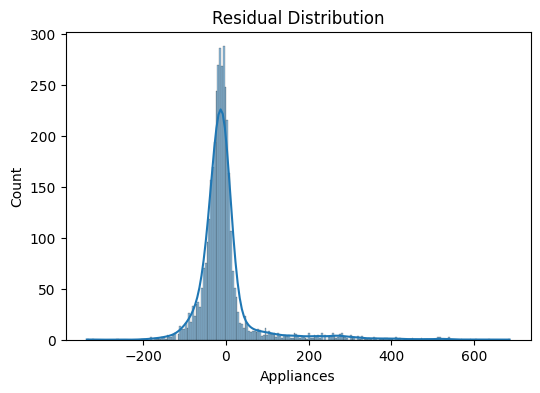

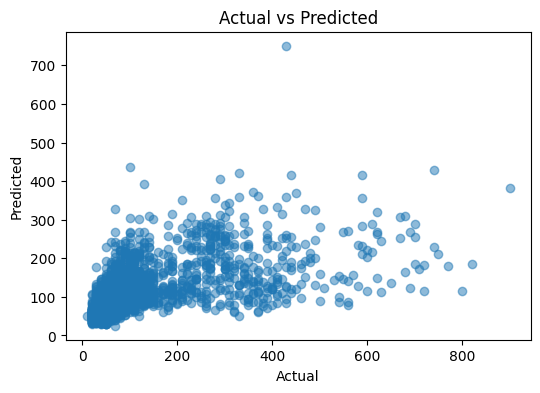

In [35]:
residuals = y_test - y_pred

plt.figure(figsize=(6,4))
sns.histplot(residuals, kde=True)
plt.title("Residual Distribution")
plt.show()

plt.figure(figsize=(6,4))
plt.scatter(y_test, y_pred, alpha=0.5)
plt.xlabel("Actual")
plt.ylabel("Predicted")
plt.title("Actual vs Predicted")
plt.show()


In [36]:
# Select an unseen test sample
new_sample = X_test.iloc[[0]]
actual_value = y_test.iloc[0]

# Predict
predicted_value = model.predict(new_sample)[0]

# Error calculation
absolute_error = abs(actual_value - predicted_value)
percentage_error = (absolute_error / actual_value) * 100

print("Actual Value:", actual_value)
print("Predicted Value:", predicted_value)
print("Absolute Error:", absolute_error)
print(f"Percentage Error: {percentage_error:.2f}%")


Actual Value: 40
Predicted Value: 46.96263971134387
Absolute Error: 6.9626397113438685
Percentage Error: 17.41%


In [37]:
import pandas as pd

feature_importance = model.get_feature_importance()
features = X_train.columns

importance_df = pd.DataFrame({
    "Feature": features,
    "Importance": feature_importance
}).sort_values(by="Importance", ascending=False)

importance_df.head(10)

,Feature,Importance
0,RH_1,12.105443
3,T3,8.702799
12,RH_8,8.263263
2,RH_2,7.045262
14,RH_out,6.803076
6,T5,6.526514
13,Press_mm_hg,6.313120
11,T8,6.178839
8,T6,6.175486
10,RH_7,5.910795


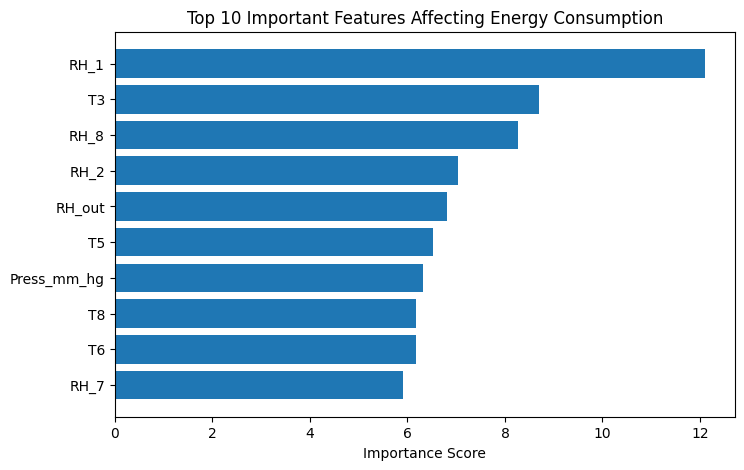

In [30]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8,5))
plt.barh(importance_df["Feature"][:10], importance_df["Importance"][:10])
plt.gca().invert_yaxis()
plt.xlabel("Importance Score")
plt.title("Top 10 Important Features Affecting Energy Consumption")
plt.show()
